## Dataset preprocessing

As DOTA dataset is originally prepared for object detection/classification tasks, it is required to preprocess the data to be used for super-resolution task. This notebook converts the data into useable format.

In [1]:
import pandas as pd
import glob
from shutil import copyfile, copytree
from PIL import Image, ImageFilter, ImageOps
import os
from random import randrange
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

In [6]:
"""
Read label and extract GSD
"""
files = glob.glob("train_labels/labelTxt/*.txt") #glob.glob("dataset/train/labelTxt/*.txt")
GSD = []
file_name = []
for file in files:
    with open(file, 'r') as f:
        file_name.append(file.split('\\')[-1])
        f.readline() # ignore first line
        txt = f.readline()
        if "null" not in txt:
            GSD.append(float(txt[4:-1]))
        else:
            GSD.append(0.0)

In [7]:
len(file_name)

1411

In [8]:
"""
Create pandas DataFrame for visualization
"""
df = pd.DataFrame({'filename': file_name, 'GSD': GSD})
df.describe()

,GSD
count,1411.000000
mean,0.390634
std,0.370889
min,0.000000
25%,0.131851
50%,0.259610
75%,0.563626
max,4.496162


<Axes: ylabel='Frequency'>

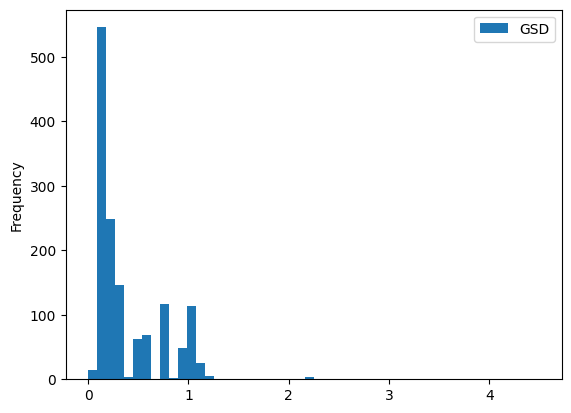

In [9]:
df.plot.hist(bins=50)

<Axes: ylabel='Frequency'>

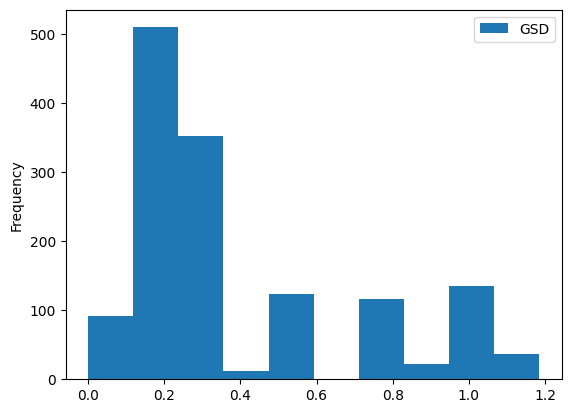

In [10]:
"""
Identify the images whose GSD is between 0 and 1.15 to have images with similar height
"""
df1 = df[df['GSD'] < 1.5]
df2 = df1[df1['GSD'] > 0]
df2.plot.hist(bins=10)

In [11]:
df2.describe()

,GSD
count,1400.000000
mean,0.375203
std,0.312500
min,0.000001
25%,0.131798
50%,0.259362
75%,0.562262
max,1.184405


In [16]:
"""
Extract image and labels that are meeting the criteria above.
"""
for index, row in df2.iterrows():
    copyfile('train/images/'+row['filename'].replace('txt', 'png'), 'train/images_stage1/'+row['filename'].replace('txt', 'png'))
    copyfile('train_labels/labelTxt/'+row['filename'], 'train_labels/labelTxt_stage1/'+row['filename'])

In [17]:
df2

,filename,GSD
0,P0000.txt,0.146344
1,P0001.txt,0.146344
2,P0002.txt,0.113877
3,P0005.txt,0.120385
4,P0008.txt,0.126616
...,...,...
1406,P2797.txt,0.269650
1407,P2800.txt,0.118072
1408,P2801.txt,0.251083
1409,P2804.txt,0.217628


In [18]:
# """
# Perform cropping
# """
# images_st1 = glob.glob("train/images_stage1/*.png")
# for img in images_st1:
#     crop('train/images_stage2', img, 1024, 1024)

# Maintain resolution of 1024x1024 across all images

In [21]:
def preprocess_and_crop(path, file, target_res, height, width):
    """
    Preprocess images to a uniform resolution, then crop into patches.
    """
    # Open image
    im = Image.open(file)
    filename = os.path.splitext(os.path.basename(file))[0]
    
    # Rescale to target resolution
    im = ImageOps.fit(im, (target_res, target_res), method=Image.Resampling.LANCZOS)
    
    imgwidth, imgheight = im.size
    k = 0

    # Perform cropping
    for i in range(0, imgheight, height):
        for j in range(0, imgwidth, width):
            box = (j, i, j+width, i+height)
            cropped = im.crop(box)
            
            # Ensure final crop size matches desired dimensions
            if cropped.size != (width, height):
                cropped = ImageOps.pad(cropped, (width, height), color=(0, 0, 0))  # Black padding
            
            # Save cropped image
            cropped.save(os.path.join(path, f"{filename}-{k}.png"))
            k += 1

# Example usage
images_st1 = glob.glob("train/images_stage1/*.png")
output_path = "train/images_stage2"
target_resolution = 2048  # Rescale all images to 4096x4096
crop_height = 1024
crop_width = 1024

os.makedirs(output_path, exist_ok=True)
for img in images_st1:
    preprocess_and_crop(output_path, img, target_resolution, crop_height, crop_width)


In [22]:
"""
Go through image and remove images where black area is included
We consider image are invalid if any 4 corner of image is black
"""
import shutil

# Remove the directory if it exists
if os.path.exists('train/images_stage3'):
    shutil.rmtree('train/images_stage3')

# Copy the directory
shutil.copytree('train/images_stage2', 'train/images_stage3')



'train/images_stage3'

In [25]:
# If the four corner pixels are black/nearly black, the image file is deleted using os.remove(img).

In [23]:
# images_st3 = glob.glob("train/images_stage3/*.png")
# c=0
# for img in images_st3:
#     image = Image.open(img)
#     width, height = image.size
#     loc = ((0,0), (width-1,0), (0,height-1), (width-1,height-1))
#     for x,y in loc:
#         try:
#             if sum(image.getpixel((x, y))) == 0:
#                 c+=1
#                 #os.remove(img)
#         except:
#             continue
#         break

Images that have any of the four corner pixels a combined RGB value close to black are removed

Text(0.5, 1.0, 'Original high res')

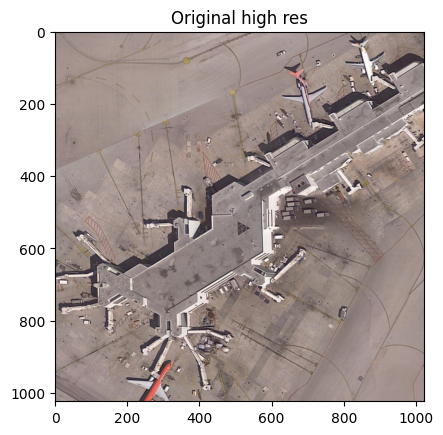

In [26]:
"""
Present some of high resolution images
"""
image_path = 'train/images_stage3/P0188-3.png'
image = Image.open(image_path)
plt.imshow(image)
plt.title("Original high res")

#image.show()

# Create low resolution images

Text(0.5, 1.0, 'Reduced to (512,512)')

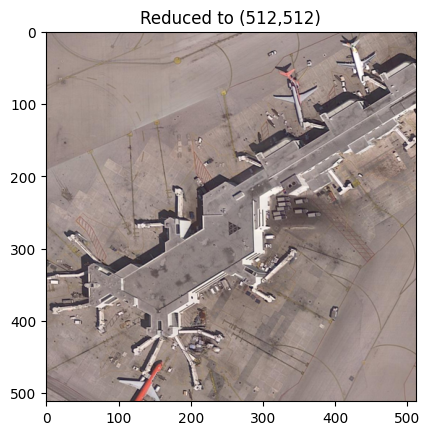

In [27]:
"""
Create low resolution image out of high resolution images
"""
reduced_512 = image.resize((512,512), resample=Image.BICUBIC)
#reduced_512.show()
plt.imshow(reduced_512)
plt.title("Reduced to (512,512)")

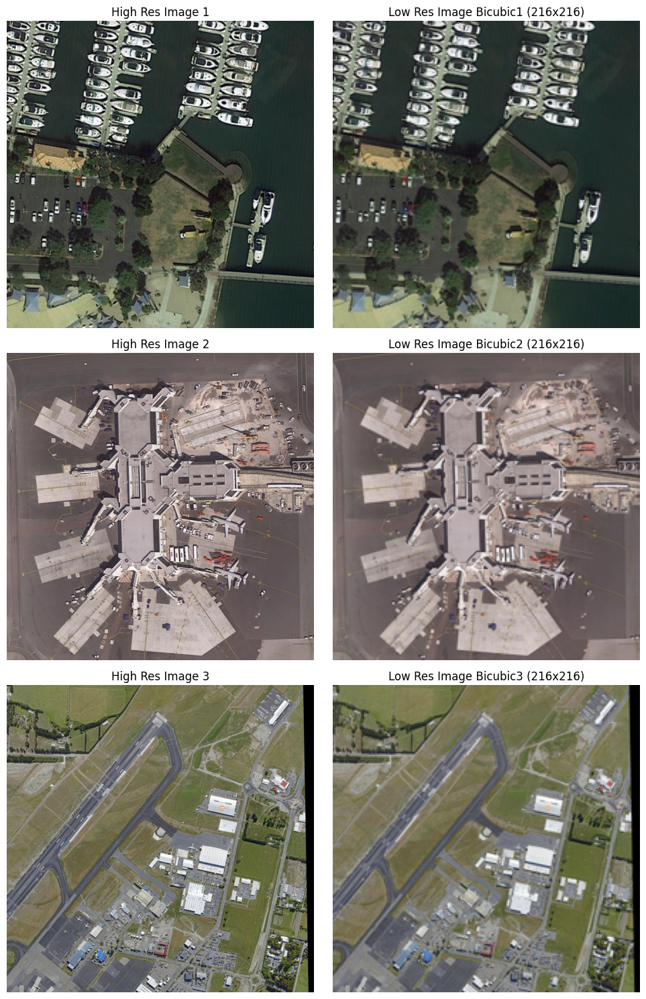

In [28]:
# preparing low resolution images with bicubic interpolation

def show_images(image_paths, target_size=(216, 216)):
    """
    Show 3 high-resolution images and their corresponding low-resolution (reduced) images.
    
    Parameters:
    - image_paths: List of image file paths for high-resolution images
    - target_size: Tuple of target size (width, height) for resizing (default is 512x512)
    """
    fig, axs = plt.subplots(3, 2, figsize=(10, 15))
    
    for i, img_path in enumerate(image_paths[:3]):
        # Load high-resolution image
        high_res_img = Image.open(img_path)
        
        # Create low-resolution image (resized)
        low_res_img = high_res_img.resize(target_size, resample=Image.BICUBIC)
        
        # Display high-resolution image
        axs[i, 0].imshow(high_res_img)
        axs[i, 0].set_title(f"High Res Image {i+1}")
        axs[i, 0].axis('off')  # Hide axis
        
        # Display low-resolution image
        axs[i, 1].imshow(low_res_img)
        axs[i, 1].set_title(f"Low Res Image Bicubic{i+1} ({target_size[0]}x{target_size[1]})")
        axs[i, 1].axis('off')  # Hide axis

    plt.tight_layout()
    plt.show()

# Example usage
image_paths = [
    'train/images_stage3/P0730-3.png',
    'train/images_stage3/P0188-0.png',
    'train/images_stage3/P2691-1.png'
]

show_images(image_paths)


# Display 2x upsampled image from low resoulution image using Bicubic interpolation

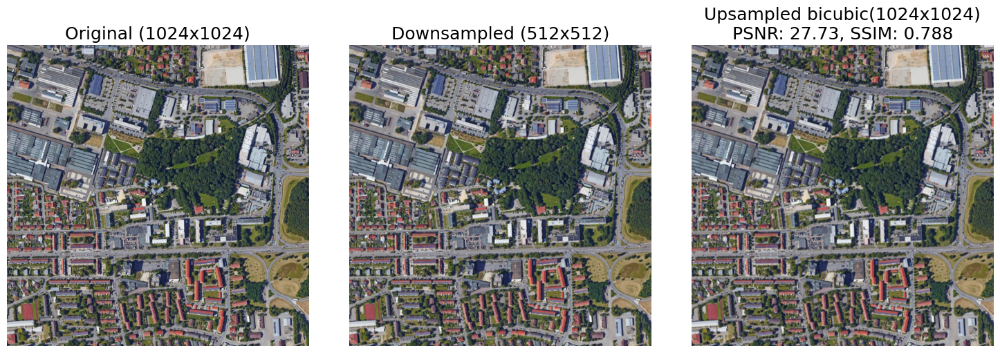

In [2]:
def downsample_and_upsample(image_path, target_size=(512, 512), upsample_size=(1024,1024), title_fontsize=14):
    """
    Downsample an image to the target size, then upsample it back to the desired size using bicubic resampling.
    Also calculates and displays PSNR and SSIM.

    Parameters:
    - image_path: The file path for the high-resolution image
    - target_size: The size to downsample to (default is 512x512)
    - upsample_size: The size to upsample to (default is 1024x1024)
    - title_fontsize: Font size for the plot titles
    """
    # Open the original high-resolution image
    original_img = Image.open(image_path)
    
    # Convert to numpy array
    original_array = np.array(original_img)

    # Downsample to the target size
    downsampled_img = original_img.resize(target_size, resample=Image.BICUBIC)
    downsampled_array = np.array(downsampled_img)

    # Upsample the downsampled image to the desired size
    upsampled_img = downsampled_img.resize(upsample_size, resample=Image.BICUBIC)
    upsampled_array = np.array(upsampled_img)

    # Compute PSNR
    psnr_up = psnr(original_array, upsampled_array, data_range=upsampled_array.max() - upsampled_array.min())
    
    # Compute SSIM with a smaller win_size and proper channel_axis
    try:
        ssim_up = ssim(
            original_array, 
            upsampled_array, 
            win_size=3,  # Ensure win_size is appropriate for the image size
            channel_axis=-1,  # Correctly handle multichannel images
            data_range=upsampled_array.max() - upsampled_array.min()
        )
    except ValueError as e:
        print("Error calculating SSIM:", e)
        ssim_up = None
    
    # Plot the images
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Display the original image
    axs[0].imshow(original_img)
    axs[0].set_title("Original (1024x1024)", fontsize=title_fontsize)
    axs[0].axis('off')

    # Display the downsampled image
    axs[1].imshow(downsampled_img)
    axs[1].set_title(f"Downsampled ({target_size[0]}x{target_size[1]})", fontsize=title_fontsize)
    axs[1].axis('off')

    # Display the upsampled image
    ssim_text = f"SSIM: {ssim_up:.3f}" if ssim_up is not None else "SSIM: Error"
    axs[2].imshow(upsampled_img)
    axs[2].set_title(f"Upsampled bicubic({upsample_size[0]}x{upsample_size[1]})\nPSNR: {psnr_up:.2f}, {ssim_text}", fontsize=title_fontsize)
    axs[2].axis('off')

    plt.tight_layout()
    
    plt.show()

# Example usage
image_path = 'train/images_stage3/P2453-0.png'
downsample_and_upsample(image_path, title_fontsize=18)  # Adjust the font size as needed


# Comparing upsampling methods - upsample by 4 times 

Comparing upsampling methods from a 256x256 input image to 1024x1024 image:


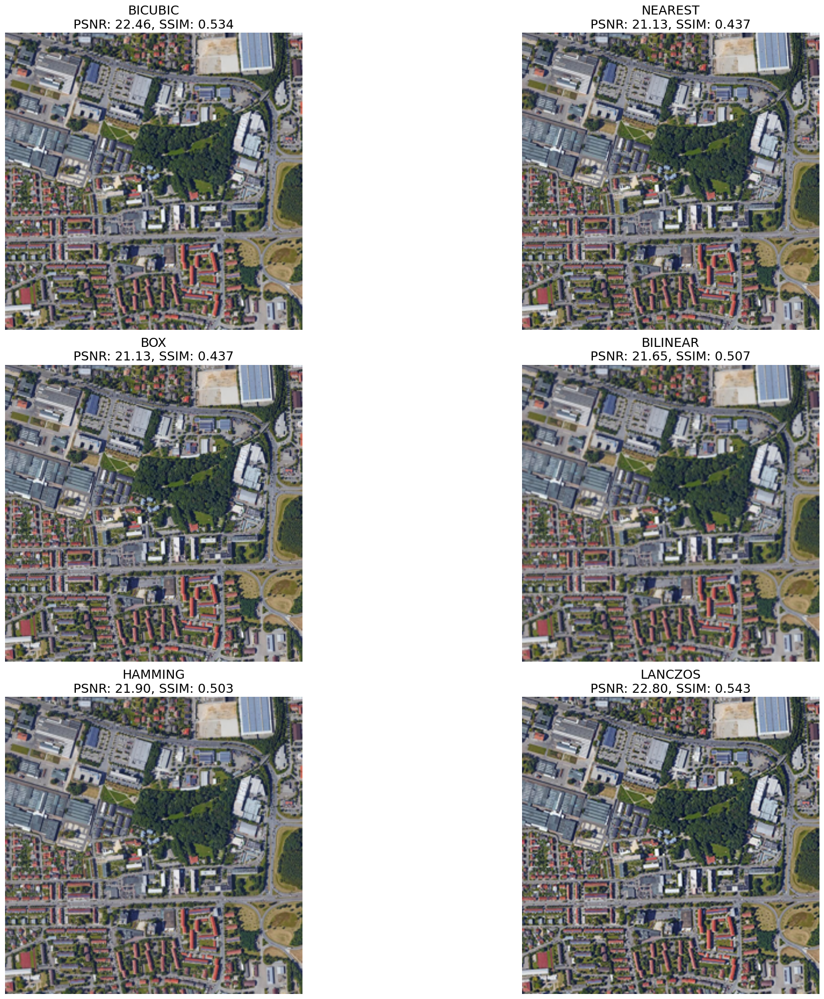

In [5]:
def upsample_image_with_methods(image, original_image, size=(1024,1024), title_fontsize=14):
    """
    Upsample an image using various resampling methods, display the results, and compute metrics.
    Input: low-resolution image 216x216
    """
    # List of resampling methods
    methods = [
        (Image.BICUBIC, "BICUBIC"),
        (Image.NEAREST, "NEAREST"),
        (Image.BOX, "BOX"),
        (Image.BILINEAR, "BILINEAR"),
        (Image.HAMMING, "HAMMING"),
        (Image.LANCZOS, "LANCZOS")
    ]

    # Convert the original image to a numpy array
    original_array = np.array(original_image)

    # Create a plot
    plt.figure(figsize=(25, 20))

    # Loop through each method and display the result
    for idx, (method, method_name) in enumerate(methods):
        # Upsample the image with the current method
        upsampled_image = image.resize(size, resample=method)

        # Convert PIL Image to numpy array for comparison
        upsampled_array = np.array(upsampled_image)

        # Compute PSNR and SSIM
        psnr_value = psnr(original_array, upsampled_array, data_range=upsampled_array.max() - upsampled_array.min())
        ssim_value = ssim(
            original_array,
            upsampled_array,
            channel_axis=-1,
            win_size=3,
            data_range=upsampled_array.max() - upsampled_array.min()
        )

        # Display the upsampled image
        plt.subplot(3, 2, idx + 1)
        plt.imshow(upsampled_array)
        plt.title(f"{method_name}\nPSNR: {psnr_value:.2f}, SSIM: {ssim_value:.3f}", fontsize=title_fontsize)
        plt.axis("off")

    # Show the plot
    plt.tight_layout()
    plt.show()

# Example usage
image_path = 'train/images_stage3/P2453-0.png'
original_image = Image.open(image_path)

# Downsample the image to a lower resolution before upsampling
low_res_image = original_image.resize((256, 256), resample=Image.BICUBIC)

print("Comparing upsampling methods from a 256x256 input image to 1024x1024 image:")
# Call the function to upsample the image with multiple methods and compute metrics
upsample_image_with_methods(low_res_image, original_image, title_fontsize=18)


comparing upsampling methods : from a 256x256 input image to 1024x1024


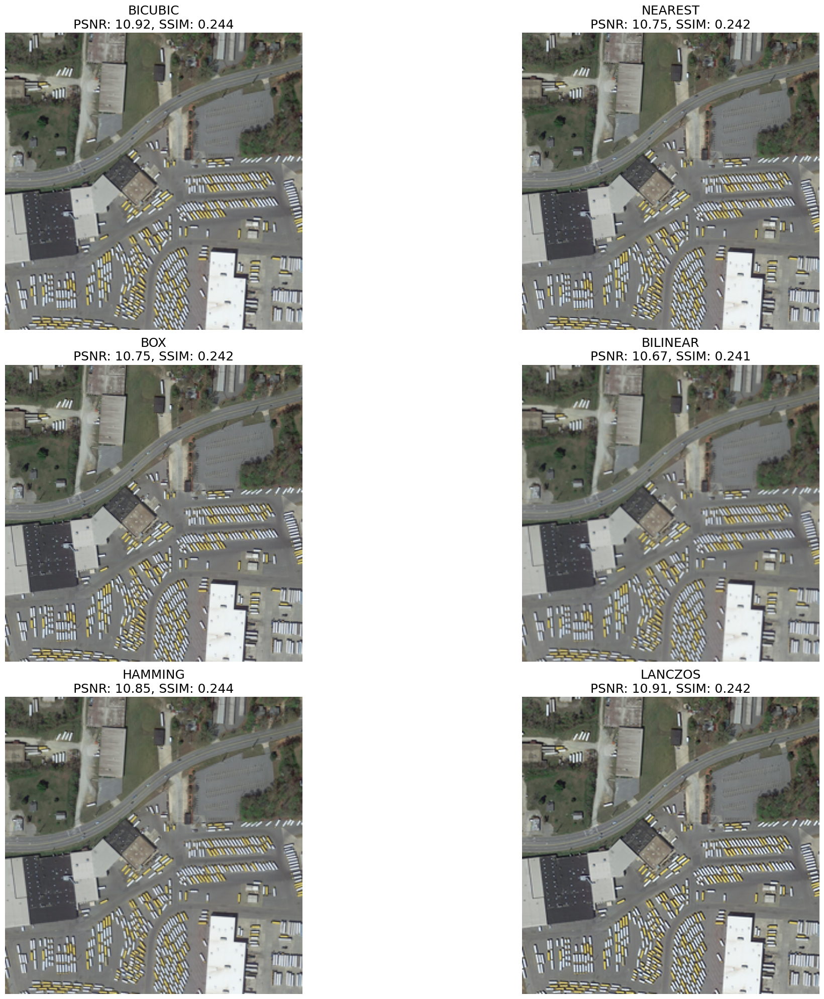

In [6]:
# Example usage
image_path = 'train/images_stage3/P2014-0.png'
image = Image.open(image_path)

# Downsample the image to a lower resolution before upsampling
reduced_216 = image.resize((256, 256), resample=Image.BICUBIC)

print("comparing upsampling methods : from a 256x256 input image to 1024x1024")
# Call the function to upsample the image with multiple methods
upsample_image_with_methods(reduced_216,original_image, title_fontsize=18)


# Create low resolution input images for training GAN networks

In [32]:
"""
Create low resolution input 256x256
Also, create 1024 low res image with bicubic
"""
images_st3 = glob.glob("train/images_stage3/*.png")
resample_method = [Image.BICUBIC, Image.NEAREST, Image.BOX, Image.BILINEAR, Image.HAMMING]
for img in images_st3:
    image = Image.open(img)
    reduced_img = image.resize((256,256), resample=resample_method[randrange(5)])
    reduced_img.save(img.replace('images_stage3', 'images_stage5'))
    upsample_img = reduced_img.resize((1024,1024), resample=Image.BICUBIC)
    upsample_img.save(img.replace('images_stage3', 'images_stage4'))
    

In [48]:
# import glob
# from PIL import Image, ImageFilter
# import random
# import numpy as np

# # Function to add slight noise to an image
# def add_noise(image, noise_factor=0.02):
#     """
#     Add Gaussian noise to the image.
#     :param image: PIL Image
#     :param noise_factor: The intensity of the noise
#     :return: Image with noise added
#     """
#     np_img = np.array(image)
#     noise = np.random.normal(0, noise_factor, np_img.shape)
#     noisy_img = np_img + noise * 255
#     noisy_img = np.clip(noisy_img, 0, 255)  # Ensure pixel values stay within [0, 255]
#     return Image.fromarray(noisy_img.astype('uint8'))

# # Function to add slight blur to an image
# def add_blur(image, blur_radius=1):
#     """
#     Add a slight Gaussian blur to the image.
#     :param image: PIL Image
#     :param blur_radius: The radius of the blur
#     :return: Image with blur applied
#     """
#     return image.filter(ImageFilter.GaussianBlur(blur_radius))

# # Function to process images
# def process_images():
#     images_st3 = ['train/images_stage3/P0188-3.png']#glob.glob("train/images_stage3/*.png")
#     resample_method = [Image.BICUBIC, Image.NEAREST, Image.BOX, Image.BILINEAR, Image.HAMMING]
    
#     for img in images_st3:
        
#         image = Image.open(img)
        
#         # Step 1: Create low resolution (256x256) image
#         reduced_img = image.resize((256, 256), resample=resample_method[random.randint(0, 4)])
        
#         # Add slight blur or noise to the low resolution image
#         if random.random() > 0.5:
#             reduced_img = add_blur(reduced_img, blur_radius=1)
#         else:
#             reduced_img = add_noise(reduced_img, noise_factor=0.02)
        
#         #Save the reduced image
#         reduced_img.save(img.replace('images_stage3', 'images_stage5'))
        
        
        
#         plt.imshow(reduced_img)
# # Run the processing function
# process_images()


Note that 

- images_stage3 => High Resolution Image 1024x1024
- images_stage4 => Low Resolution 1024x1024 (downsampled by 2 times)
- images_stage5 => Low Resolution 256x256 (downsampled by 4 times)